# "InsureCheck" - Insurance Awareness & Assessment Platform

Our project aims to identify individuals who are most likely to need and be interested in vehicle insurance. The goal is to enable insurance providers and community organizations to conduct targeted awareness campaigns and outreach, ultimately developing greater financial security within the community. 

### Team Member:
1. Rafi Daffa Ramadhani - S2155407
2. Loginova Ekaterina - 24076021
3. Muhammad Haziq Halifi bin Ab Rahman - U2101028
4. Muhammad Huseyin Adem Kilicman - 22061226
5. AHMAD ZAMIL MUTTAQIN BIN AHMAD ZAIDI - 22004054

# Import

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
from collections import Counter

import pickle
import json
from datetime import datetime
import os
import warnings
warnings.filterwarnings('ignore')

In [42]:
np.random.seed(42)
pd.set_option('display.max_columns', None)
plt.style.use('seaborn-v0_8-darkgrid')

In [43]:
df = pd.read_csv('train.csv')

print("Dataset Shape:", df.shape)
print("\nColumn Information:")
print(df.info())
print("\nFirst 5 rows:")
print(df.head())

print("\nMissing Values:", df.isnull().sum().sum())
print("Duplicate Rows:", df.duplicated().sum())
print("\nStatistical Summary:")
print(df.describe())

Dataset Shape: (381109, 12)

Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB
None

First 5 rows:
   id  Gender  Age  Driving_L

# Data Analysis

In [44]:
# Age group analysis
age_groups = pd.cut(df['Age'], bins=[20, 30, 40, 50, 60, 100],
                    labels=['20-30', '31-40', '41-50', '51-60', '60+'])
age_response = pd.crosstab(age_groups, df['Response'], normalize='index') * 100
print("\nInsurance Interest by Age Group (%):")
print(age_response.round(2))


Insurance Interest by Age Group (%):
Response      0      1
Age                   
20-30     95.48   4.52
31-40     78.98  21.02
41-50     78.90  21.10
51-60     82.97  17.03
60+       90.31   9.69


In [45]:
# Regional analysis
regional_interest = df.groupby('Region_Code')['Response'].agg(['mean', 'count'])
regional_interest = regional_interest[regional_interest['count'] > 100]
underserved_regions = regional_interest.sort_values('mean').head(10)
print("\nTop 10 Regions with Lowest Insurance Interest:")
print(underserved_regions)


Top 10 Regions with Lowest Insurance Interest:
                 mean  count
Region_Code                 
44.0         0.040842    808
25.0         0.042749   2503
10.0         0.060128   4374
50.0         0.062677  10243
22.0         0.063407   1309
16.0         0.066766   2007
6.0          0.069904   6280
17.0         0.070310   2617
21.0         0.071027   4266
2.0          0.071075   4038


In [46]:
# Gender analysis
gender_response = pd.crosstab(df['Gender'], df['Response'], normalize='index') * 100
print("\nInsurance Interest by Gender (%):")
print(gender_response.round(2))


Insurance Interest by Gender (%):
Response      0      1
Gender                
Female    89.61  10.39
Male      86.16  13.84


# Feature Engineering

In [47]:
# Age categories
df['Age_Category'] = pd.cut(df['Age'],
                           bins=[20, 30, 40, 50, 60, 100],
                           labels=['Young', 'Early_Career', 'Mid_Career', 'Late_Career', 'Senior'])

# Premium categories
df['Premium_Category'] = pd.qcut(df['Annual_Premium'],
                                q=4,
                                labels=['Low', 'Medium', 'High', 'Very_High'])

# Vehicle age numeric mapping
vehicle_age_map = {'< 1 Year': 0, '1-2 Year': 1, '> 2 Years': 2}
df['Vehicle_Age_Numeric'] = df['Vehicle_Age'].map(vehicle_age_map)

# Risk profile
df['Risk_Profile'] = 0
df.loc[(df['Vehicle_Damage'] == 'Yes') & (df['Age'] > 30), 'Risk_Profile'] = 1
df.loc[(df['Vehicle_Damage'] == 'Yes') & (df['Age'] <= 30), 'Risk_Profile'] = 2


# Data Visualization

### Vehicle Damage Analysis

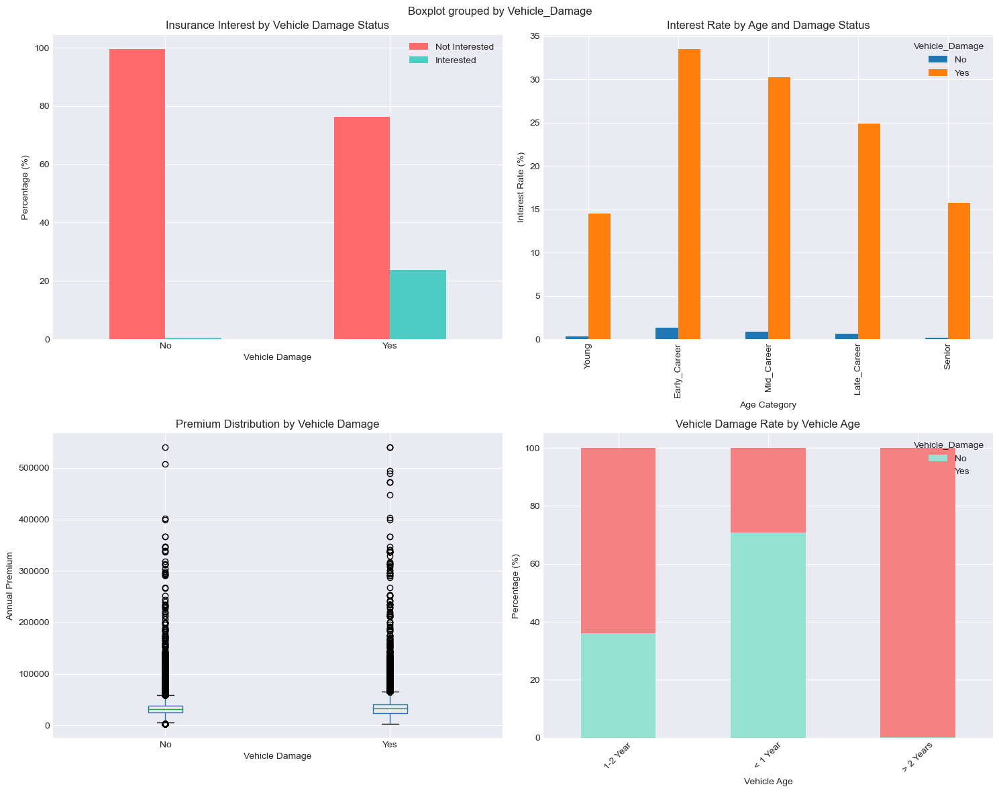


Damage Impact: 23.8% (with damage) vs 0.5% (without)


In [48]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

damage_response = pd.crosstab(df['Vehicle_Damage'], df['Response'], normalize='index') * 100
damage_response.plot(kind='bar', ax=axes[0,0], color=['#ff6b6b', '#4ecdc4'])
axes[0,0].set_title('Insurance Interest by Vehicle Damage Status')
axes[0,0].set_xlabel('Vehicle Damage')
axes[0,0].set_ylabel('Percentage (%)')
axes[0,0].legend(['Not Interested', 'Interested'])
axes[0,0].tick_params(axis='x', rotation=0)

age_damage = pd.crosstab([df['Age_Category'], df['Vehicle_Damage']], df['Response'], normalize='index') * 100
age_damage[1].unstack().plot(kind='bar', ax=axes[0,1])
axes[0,1].set_title('Interest Rate by Age and Damage Status')
axes[0,1].set_xlabel('Age Category')
axes[0,1].set_ylabel('Interest Rate (%)')

df.boxplot(column='Annual_Premium', by='Vehicle_Damage', ax=axes[1,0])
axes[1,0].set_title('Premium Distribution by Vehicle Damage')
axes[1,0].set_xlabel('Vehicle Damage')
axes[1,0].set_ylabel('Annual Premium')

vehicle_damage_age = pd.crosstab(df['Vehicle_Age'], df['Vehicle_Damage'], normalize='index') * 100
vehicle_damage_age.plot(kind='bar', ax=axes[1,1], stacked=True, color=['#95e1d3', '#f38181'])
axes[1,1].set_title('Vehicle Damage Rate by Vehicle Age')
axes[1,1].set_xlabel('Vehicle Age')
axes[1,1].set_ylabel('Percentage (%)')
axes[1,1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

damage_impact = df.groupby('Vehicle_Damage')['Response'].mean()
print(f"\nDamage Impact: {damage_impact['Yes']*100:.1f}% (with damage) vs {damage_impact['No']*100:.1f}% (without)")


### Sales Channel Analysis

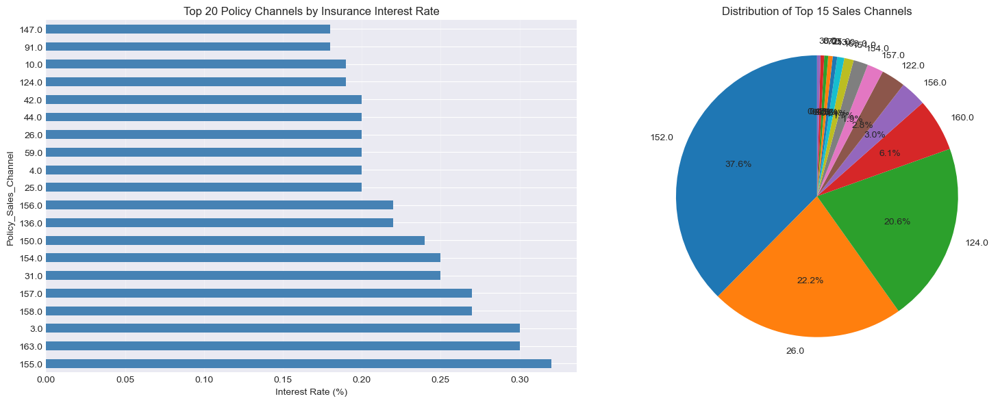

In [49]:
channel_stats = df.groupby('Policy_Sales_Channel').agg({
    'Response': ['mean', 'count'],
    'Age': 'mean',
    'Annual_Premium': 'mean'
}).round(2)
channel_stats.columns = ['Interest_Rate', 'Customer_Count', 'Avg_Age', 'Avg_Premium']
channel_stats = channel_stats[channel_stats['Customer_Count'] > 100]
channel_stats = channel_stats.sort_values('Interest_Rate', ascending=False).head(20)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
channel_stats['Interest_Rate'].plot(kind='barh', ax=ax1, color='steelblue')
ax1.set_xlabel('Interest Rate (%)')
ax1.set_title('Top 20 Policy Channels by Insurance Interest Rate')
ax1.grid(True, alpha=0.3, axis='x')

channel_dist = df['Policy_Sales_Channel'].value_counts().head(15)
ax2.pie(channel_dist.values, labels=channel_dist.index, autopct='%1.1f%%', startangle=90)
ax2.set_title('Distribution of Top 15 Sales Channels')
plt.tight_layout()
plt.show()


### Premium Analysis

In [50]:
fig = make_subplots(rows=2, cols=2,
                    subplot_titles=('Premium Distribution', 'Premium vs Age',
                                  'Premium by Response', 'Vintage vs Premium'),
                    specs=[[{"type": "histogram"}, {"type": "scatter"}],
                          [{"type": "box"}, {"type": "scatter"}]])

fig.add_trace(go.Histogram(x=df['Annual_Premium'], nbinsx=50, name='Premium'), row=1, col=1)

sample_df = df.sample(n=5000, random_state=42)
fig.add_trace(go.Scatter(x=sample_df['Age'], y=sample_df['Annual_Premium'],
                        mode='markers', marker=dict(size=4, opacity=0.5)), row=1, col=2)

for response in [0, 1]:
    data = df[df['Response'] == response]['Annual_Premium']
    fig.add_trace(go.Box(y=data, name=f'Response {response}'), row=2, col=1)

fig.add_trace(go.Scatter(x=sample_df['Vintage'], y=sample_df['Annual_Premium'],
                        mode='markers', marker=dict(size=4, opacity=0.5)), row=2, col=2)

fig.update_layout(height=800, showlegend=False, title_text="Premium Analysis Dashboard")
fig.show()

premium_quartiles = df['Annual_Premium'].quantile([0.25, 0.5, 0.75])
print("\nPremium Affordability:")
print(f"25th percentile: ₹{premium_quartiles[0.25]:,.0f}")
print(f"Median: ₹{premium_quartiles[0.5]:,.0f}")
print(f"75th percentile: ₹{premium_quartiles[0.75]:,.0f}")

young_premium = df[df['Age'] < 30]['Annual_Premium'].mean()
overall_premium = df['Annual_Premium'].mean()
print(f"\nYoung people (<30) average premium: ₹{young_premium:,.0f}")
print(f"Overall average: ₹{overall_premium:,.0f}")


Premium Affordability:
25th percentile: ₹24,405
Median: ₹31,669
75th percentile: ₹39,400

Young people (<30) average premium: ₹30,175
Overall average: ₹30,564


# Data Preprocessing

In [51]:
feature_cols = ['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
                'Vehicle_Age_Numeric', 'Annual_Premium', 'Policy_Sales_Channel', 'Vintage']

label_encoders = {}
categorical_cols = ['Gender', 'Vehicle_Damage']
df_model = df.copy()

for col in categorical_cols:
    le = LabelEncoder()
    df_model[col + '_Encoded'] = le.fit_transform(df_model[col])
    label_encoders[col] = le
    feature_cols.append(col + '_Encoded')

# Set Response as a target
X = df_model[feature_cols]
y = df_model['Response']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42, stratify=y)


### Apply SMOTE

In [52]:
print(f"Original distribution: {Counter(y_train)}")

smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)
print(f"After SMOTE distribution: {Counter(y_train_balanced)}")

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_balanced_scaled = scaler.transform(X_train_balanced)
X_test_scaled = scaler.transform(X_test)

print("\nData preprocessing completed!")
print(f"Training set: {X_train.shape}")
print(f"Test set: {X_test.shape}")

Original distribution: Counter({0: 267519, 1: 37368})
After SMOTE distribution: Counter({0: 267519, 1: 267519})

Data preprocessing completed!
Training set: (304887, 10)
Test set: (76222, 10)


# Model Training and Evaluation

### Calculate class weights

In [53]:
class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=np.unique(y_train),
                                                  y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

results = {}

### Logistic Regression

In [54]:
print("\nTraining Logistic Regression...")
lr_model = LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced')
lr_model.fit(X_train_scaled, y_train)

# Predictions
lr_pred = lr_model.predict(X_test_scaled)
lr_pred_proba = lr_model.predict_proba(X_test_scaled)[:, 1]

# Evaluation
lr_auc = roc_auc_score(y_test, lr_pred_proba)
print(f"Logistic Regression - AUC Score: {lr_auc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, lr_pred))

results['Logistic Regression'] = {
    'model': lr_model,
    'predictions': lr_pred,
    'probabilities': lr_pred_proba,
    'auc_score': lr_auc,
    'classification_report': classification_report(y_test, lr_pred, output_dict=True)
}



Training Logistic Regression...
Logistic Regression - AUC Score: 0.8343

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.59      0.74     66880
           1       0.25      0.98      0.40      9342

    accuracy                           0.64     76222
   macro avg       0.62      0.78      0.57     76222
weighted avg       0.90      0.64      0.70     76222



### Random Forest

In [55]:
print("\nTraining Random Forest...")
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1, class_weight='balanced')
rf_model.fit(X_train, y_train)

# Predictions
rf_pred = rf_model.predict(X_test)
rf_pred_proba = rf_model.predict_proba(X_test)[:, 1]

# Evaluation
rf_auc = roc_auc_score(y_test, rf_pred_proba)
print(f"Random Forest - AUC Score: {rf_auc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, rf_pred))

results['Random Forest'] = {
    'model': rf_model,
    'predictions': rf_pred,
    'probabilities': rf_pred_proba,
    'auc_score': rf_auc,
    'classification_report': classification_report(y_test, rf_pred, output_dict=True)
}


Training Random Forest...
Random Forest - AUC Score: 0.8324

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     66880
           1       0.36      0.10      0.16      9342

    accuracy                           0.87     76222
   macro avg       0.62      0.54      0.54     76222
weighted avg       0.82      0.87      0.83     76222



### XGBoost

In [56]:
print("\nTraining XGBoost...")
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', 
                          scale_pos_weight=class_weights[1]/class_weights[0])
xgb_model.fit(X_train, y_train)

# Predictions
xgb_pred = xgb_model.predict(X_test)
xgb_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Evaluation
xgb_auc = roc_auc_score(y_test, xgb_pred_proba)
print(f"XGBoost - AUC Score: {xgb_auc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, xgb_pred))

# Store results
results['XGBoost'] = {
    'model': xgb_model,
    'predictions': xgb_pred,
    'probabilities': xgb_pred_proba,
    'auc_score': xgb_auc,
    'classification_report': classification_report(y_test, xgb_pred, output_dict=True)
}



Training XGBoost...
XGBoost - AUC Score: 0.8559

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.69      0.81     66880
           1       0.29      0.91      0.44      9342

    accuracy                           0.72     76222
   macro avg       0.64      0.80      0.63     76222
weighted avg       0.90      0.72      0.77     76222



# Model Comparison

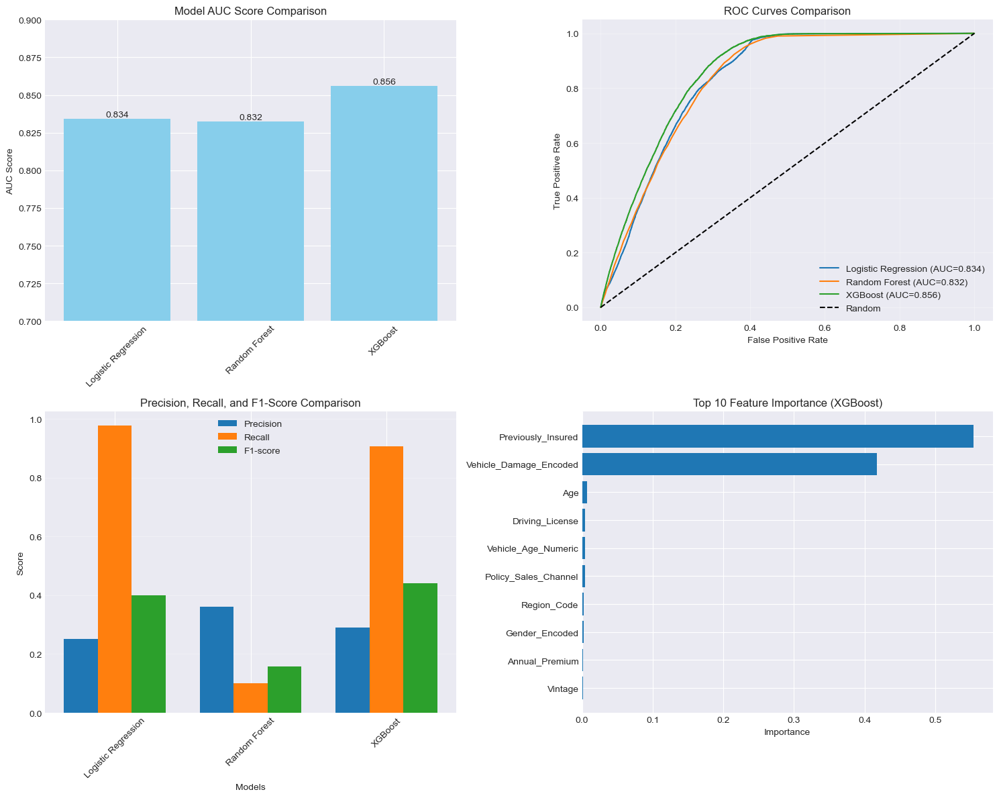


Best performing model: XGBoost (AUC: 0.8559)


In [57]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# AUC Scores
auc_scores = {name: res['auc_score'] for name, res in results.items()}
ax1 = axes[0, 0]
bars = ax1.bar(auc_scores.keys(), auc_scores.values(), color='skyblue')
ax1.set_ylabel('AUC Score')
ax1.set_title('Model AUC Score Comparison')
ax1.set_ylim(0.7, 0.9)
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.3f}', ha='center', va='bottom')
ax1.tick_params(axis='x', rotation=45)

# ROC Curves
ax2 = axes[0, 1]
for name, res in results.items():
    fpr, tpr, _ = roc_curve(y_test, res['probabilities'])
    ax2.plot(fpr, tpr, label=f"{name} (AUC={res['auc_score']:.3f})")
ax2.plot([0, 1], [0, 1], 'k--', label='Random')
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('ROC Curves Comparison')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Precision-Recall comparison
ax3 = axes[1, 0]
metrics = ['precision', 'recall', 'f1-score']
model_names = list(results.keys())
x = np.arange(len(model_names))
width = 0.25

for i, metric in enumerate(metrics):
    values = [results[name]['classification_report']['1'][metric] for name in model_names]
    ax3.bar(x + i*width, values, width, label=metric.capitalize())

ax3.set_xlabel('Models')
ax3.set_ylabel('Score')
ax3.set_title('Precision, Recall, and F1-Score Comparison')
ax3.set_xticks(x + width)
ax3.set_xticklabels(model_names, rotation=45)
ax3.legend()
ax3.grid(True, alpha=0.3, axis='y')

# Feature importance
best_model_name = max(auc_scores, key=auc_scores.get)
ax4 = axes[1, 1]

if best_model_name in ['Random Forest', 'XGBoost']:
    best_model = results[best_model_name]['model']
    feature_importance = pd.DataFrame({
        'feature': X_train.columns,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=True).tail(10)
    
    ax4.barh(feature_importance['feature'], feature_importance['importance'])
    ax4.set_xlabel('Importance')
    ax4.set_title(f'Top 10 Feature Importance ({best_model_name})')
else:
    ax4.text(0.5, 0.5, 'Feature importance not available\nfor this model type',
             ha='center', va='center', transform=ax4.transAxes)
    ax4.set_title('Feature Importance')

plt.tight_layout()
plt.show()

print(f"\nBest performing model: {best_model_name} (AUC: {auc_scores[best_model_name]:.4f})")

Based on the result, the best model is XGBoost and Linear regression at the second.

# Evaluation

In [58]:
best_model_results = results[best_model_name]
precision = best_model_results['classification_report']['1']['precision']
recall = best_model_results['classification_report']['1']['recall']

print("\nBusiness Impact Analysis:")
print(f"- Precision: {precision:.2%} of predicted interested customers are actually interested while the {1 - precision:.2%} are the potential customer")
print(f"- Recall: {recall:.2%} of actually interested customers are identified")


Business Impact Analysis:
- Precision: 29.04% of predicted interested customers are actually interested while the 70.96% are the potential customer
- Recall: 90.59% of actually interested customers are identified


# Model Deploy

In [59]:
def predict_insurance_interest(customer_data, model, scaler, label_encoders, vehicle_age_map):
    """Predict insurance interest for new customers"""
    customer_df = pd.DataFrame([customer_data])
    
    # Encode categorical variables
    if 'Gender' in customer_df.columns:
        customer_df['Gender_Encoded'] = label_encoders['Gender'].transform(customer_df['Gender'])
    if 'Vehicle_Damage' in customer_df.columns:
        customer_df['Vehicle_Damage_Encoded'] = label_encoders['Vehicle_Damage'].transform(customer_df['Vehicle_Damage'])
    
    # Map vehicle age
    if 'Vehicle_Age' in customer_df.columns:
        customer_df['Vehicle_Age_Numeric'] = customer_df['Vehicle_Age'].map(vehicle_age_map)
    
    # Select features
    X_new = customer_df[feature_cols]
    
    # Scale
    if isinstance(model, LogisticRegression):
        X_new = scaler.transform(X_new)
    
    # Predict
    probability = model.predict_proba(X_new)[0, 1]
    prediction = model.predict(X_new)[0]
    
    return prediction, probability

In [60]:
young_professional = {
    'Age': 25, 'Gender': 'Male', 'Driving_License': 1, 'Region_Code': 28,
    'Previously_Insured': 0, 'Vehicle_Age': '< 1 Year', 'Vehicle_Damage': 'No',
    'Annual_Premium': 25000, 'Policy_Sales_Channel': 152, 'Vintage': 30
}

family_person = {
    'Age': 40, 'Gender': 'Female', 'Driving_License': 1, 'Region_Code': 8,
    'Previously_Insured': 0, 'Vehicle_Age': '1-2 Year', 'Vehicle_Damage': 'Yes',
    'Annual_Premium': 35000, 'Policy_Sales_Channel': 26, 'Vintage': 180
}

profiles = [("Young Urban Professional", young_professional),
            ("Middle-aged Family Person", family_person)]

for profile_name, profile_data in profiles:
    pred, prob = predict_insurance_interest(profile_data, best_model, scaler, label_encoders, vehicle_age_map)
    print(f"\n{profile_name}:")
    print(f"- Prediction: {'Interested' if pred == 1 else 'Not Interested'}")
    print(f"- Probability: {prob:.2%}")
    print(f"- Action: {'High priority' if prob > 0.5 else 'Low priority'}")


Young Urban Professional:
- Prediction: Not Interested
- Probability: 19.21%
- Action: Low priority

Middle-aged Family Person:
- Prediction: Interested
- Probability: 78.17%
- Action: High priority


In [62]:
import os
import pickle
import json
from datetime import datetime

# Create directory if it doesn't exist
os.makedirs('model_results', exist_ok=True)

# Save model
with open(f'model_results/best_model_{best_model_name.replace(" ", "_").lower()}.pkl', 'wb') as f:
    pickle.dump(results[best_model_name]['model'], f)

# Save preprocessing objects
with open('model_results/scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

with open('model_results/label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

# Save metrics
metrics_summary = {
    'model_name': best_model_name,
    'auc_score': results[best_model_name]['auc_score'],
    'precision': results[best_model_name]['classification_report']['1']['precision'],
    'recall': results[best_model_name]['classification_report']['1']['recall'],
    'f1_score': results[best_model_name]['classification_report']['1']['f1-score'],
    'training_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
    'dataset_size': len(df),
    'features_used': feature_cols
}

with open('model_results/model_metrics.json', 'w') as f:
    json.dump(metrics_summary, f, indent=4)

print("model saved!")

model saved!
